In [1]:
# Set the first GPU as visible
%env CUDA_VISIBLE_DEVICES=4

env: CUDA_VISIBLE_DEVICES=4


In [ ]:
import cv2
import sys
import torch
import numpy as np

sys.path.append('/home/sebastian.cavada/scsv/thesis/mast3r_mine')
import mast3r.utils.path_to_dust3r  # noqa

from dust3r.inference import inference
from dust3r.model import AsymmetricCroCo3DStereo
from dust3r.utils.image import load_images
from dust3r.image_pairs import make_pairs
from dust3r.cloud_opt import global_aligner, GlobalAlignerMode

from mast3r.model import AsymmetricMASt3R

import matplotlib.pyplot as plt
import imageio.v2 as imageio

import torch
import torch.nn.functional as F

import os
import json

import numpy as np
from pathlib import Path

import sys
import imageio.v2 as imageio
import matplotlib.pyplot as plt

from typing import Set
sys.path.append('/home/sebastian.cavada/scsv/thesis/mast3r_mine/dust3r')

from dust3r.utils.geometry import depthmap_to_pts3d, depthmap_to_camera_coordinates, depthmap_to_absolute_camera_coordinates # nofq

# Specify the folder containing JSON files
folder_path = './arkitscenes_pairs/Test'

file_name = folder_path + "/scene_list.json"
print(file_name)

with open(file_name, 'r') as file:
    scene_list = json.load(file)

    print(scene_list)

gt_path = Path('/data3/sebastian.cavada/datasets/arkitscenes_test/Test')

/home/sebastian.cavada/scsv/thesis/mast3r_mine/dust3r/dust3r/cloud_opt/base_opt.py:275: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  @torch.cuda.amp.autocast(enabled=False)


./arkitscenes_pairs/Test/scene_list.json
['45663206', '41126514', '45261728', '41126453', '45261201', '45261164', '41126467', '47204861', '41249059', '41126383', '41126554', '41126500', '47204856', '47204325', '41126619', '45261228', '45261203', '41249065', '41126534', '41126307', '47204842', '45261230', '41126598', '41159368', '41126439', '41126541', '41126567', '41126516', '45663205', '41126597', '41126367', '45261246', '41126305', '45261248', '47204319', '45261277', '41126417', '41126446', '45261713', '41126589', '41126401', '41159375', '45261167', '41125976', '41126526', '41125937', '41159369', '45261689', '45261251', '45261681', '47204330', '41126518', '41249056', '41126550', '45261265', '41126543', '41126580', '45261172', '47204341', '41392191', '41126297', '41126498', '41159381', '41126466', '45261158', '45261709', '47204322', '47204836', '41126592', '45261269', '41125972', '41126494', '41126533', '45261169', '45261206', '45261686', '45261662', '41249063', '47204350', '41126603'

[ 5. 42.]
[[-0.49226679 -0.05884664  0.86845292 -0.39389293]
 [-0.87034379  0.04844338 -0.49005605  0.56289889]
 [-0.01323264 -0.99709092 -0.07506387  0.89142121]
 [ 0.          0.          0.          1.        ]]


/home/sebastian.cavada/micromamba/envs/mast3r/lib/python3.11/site-packages/imageio/plugins/pillow.py:320: UserWarning: Loading 16-bit (uint16) PNG as int32 due to limitations in pillow's PNG decoder. This will be fixed in a future version of pillow which will make this warning dissapear.
  warnings.warn(


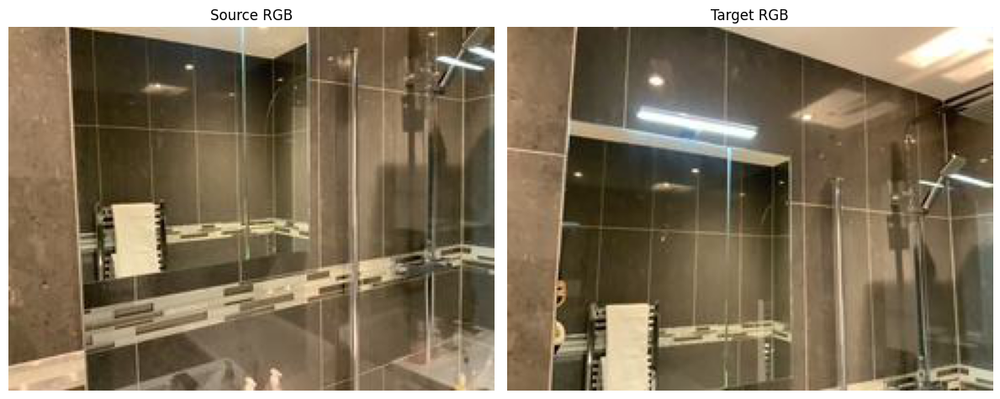

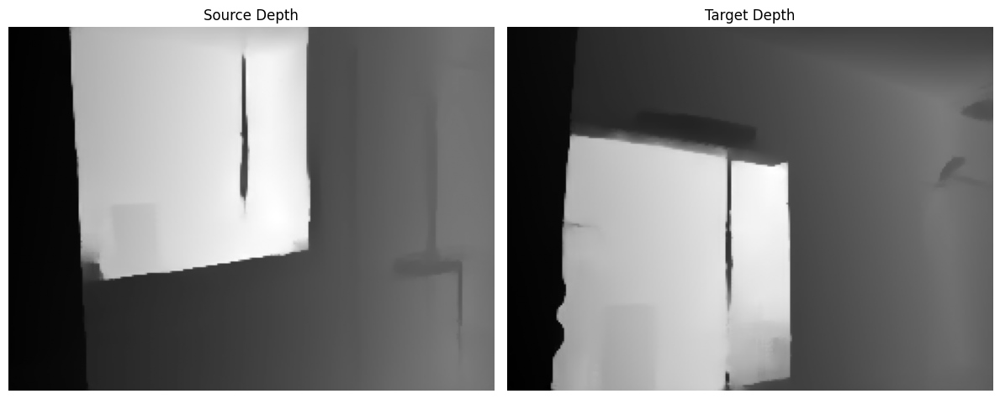

[[211.949    0.     127.933 ]
 [  0.     211.949   95.9333]
 [  0.       0.       1.    ]]
(192, 256, 3)
(192, 256, 3)


In [3]:
np.random.seed(42)

for scene in scene_list[3:4]:    
    scene_path = Path(folder_path) / scene / "selected_pairs.npz"
    # print(scene_path)
    data = np.load(scene_path, allow_pickle=True)  # allow_pickle=True is optional; depends on the file content.
    # print(data)
    # print(len(data['selection']))        

    # the common elements are all in the gt_data
    # common_elements = list(set(data['selection']) & set(gt_data['images']))
    # # intersection = [item for item in data['selection'] if item in gt_data['images']]
    # print(len(common_elements))

    gt_file_path = gt_path / scene / "scene_metadata.npz"
    gt_data = np.load(gt_file_path, allow_pickle=True)
    selected_indexes = np.random.randint(0, len(gt_data['pairs']), 100)
    selected_pairs = gt_data['pairs'][selected_indexes]    
    # print(len(gt_data['images']))    
    # print(len(gt_data['intrinsics']))
    # print(len(selected_pairs))

    # okay here then we need to convert depth maps to 3D point cloudsss HOW boh vediamo pomeriggio

    for pair in selected_pairs[:1]:
        print(pair[:2])

        print(gt_data['trajectories'][int(pair[0])] )
        
        src_depth = gt_data['images'][int(pair[0])] 
        target_depth = gt_data['images'][int(pair[1])]

        src_depth_path = gt_path / scene / "lowres_depth" / src_depth
        target_depth_path = gt_path / scene / "lowres_depth" / target_depth

        src_rgb_path = gt_path / scene / "vga_wide" / src_depth.replace('.png', '.jpg')
        target_rgb_path = gt_path / scene / "vga_wide" / target_depth.replace('.png', '.jpg')

        src_depth_image = imageio.imread(src_depth_path)
        target_depth_image = imageio.imread(target_depth_path)    

        src_rgb_image = imageio.imread(src_rgb_path)
        target_rgb_image = imageio.imread(target_rgb_path)

        # print(src_rgb_path)
        # print(target_rgb_path)

        # Create a figure with two subplots side by side
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))

        # Display the source depth image
        axes[0].imshow(src_rgb_image)  # Use 'gray' colormap for depth maps
        axes[0].set_title('Source RGB')
        axes[0].axis('off')  # Hide axis

        # Display the target depth image
        axes[1].imshow(target_rgb_image)
        axes[1].set_title('Target RGB')
        axes[1].axis('off')

        # Adjust layout and display
        plt.tight_layout()
        plt.show()

                # Create a figure with two subplots side by side
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))

        # Display the source depth image
        axes[0].imshow(src_depth_image, cmap='gray')  # Use 'gray' colormap for depth maps
        axes[0].set_title('Source Depth')
        axes[0].axis('off')  # Hide axis

        # Display the target depth image
        axes[1].imshow(target_depth_image, cmap='gray')
        axes[1].set_title('Target Depth')
        axes[1].axis('off')

        # Adjust layout and display
        plt.tight_layout()
        plt.show()

        # print(type(src_depth_image))
        # print(gt_data['intrinsics'])

        fx, fy, cx, cy = gt_data['intrinsics'][int(pair[0])][2:]
        camera_intrinsics = np.eye(3)
        camera_intrinsics[0,0] = fx
        camera_intrinsics[1,1] = fy
        camera_intrinsics[0,2] = cx
        camera_intrinsics[1,2] = cy
        print(camera_intrinsics)

        camera_extrinsics_img1 = gt_data['trajectories'][int(pair[0])]
        camera_extrinsics_img2 = gt_data['trajectories'][int(pair[1])] 
        
        pts3d_img1, valid_mask_img1 = depthmap_to_absolute_camera_coordinates(src_depth_image, camera_intrinsics, camera_extrinsics_img1)
        pts3d_img2, valid_mask_img2 = depthmap_to_absolute_camera_coordinates(target_depth_image, camera_intrinsics, camera_extrinsics_img2)

        # X_cam, valid_mask = depthmap_to_camera_coordinates(src_depth_image, camera_intrinsics)
        print(pts3d_img1.shape)
        print(pts3d_img2.shape)

                

In [4]:
def todevice(batch, device, callback=None, non_blocking=False):
    ''' Transfer some variables to another device (i.e. GPU, CPU:torch, CPU:numpy).

    batch: list, tuple, dict of tensors or other things
    device: pytorch device or 'numpy'
    callback: function that would be called on every sub-elements.
    '''
    if callback:
        batch = callback(batch)

    if isinstance(batch, dict):
        return {k: todevice(v, device) for k, v in batch.items()}

    if isinstance(batch, (tuple, list)):
        return type(batch)(todevice(x, device) for x in batch)

    x = batch
    if device == 'numpy':
        if isinstance(x, torch.Tensor):
            x = x.detach().cpu().numpy()
    elif x is not None:
        if isinstance(x, np.ndarray):
            x = torch.from_numpy(x)
        if torch.is_tensor(x):
            x = x.to(device, non_blocking=non_blocking)
    return x


to_device = todevice  # alias


def to_numpy(x): return todevice(x, 'numpy')
def to_cpu(x): return todevice(x, 'cpu')
def to_cuda(x): return todevice(x, 'cuda')

if __name__ == '__main__':
    device = 'cuda'
    batch_size = 1
    schedule = 'cosine'
    lr = 0.01
    niter = 300

    model_name = "naver/MASt3R_ViTLarge_BaseDecoder_512_catmlpdpt_metric"
    # you can put the path to a local checkpoint in model_name if needed
    model = AsymmetricMASt3R.from_pretrained(model_name).to(device)
    # load_images can take a list of images or a directory

    # the idea is, load the image pairs from dust3r and use them to do inference
    # for each pair compute the various distances BLABLA and let them evaluate

    # img_list = ['/data3/sebastian.cavada/datasets/arkitscenes_test/Test/45663206/vga_wide/45663206_65708.102.jpg', '/data3/sebastian.cavada/datasets/arkitscenes_test/Test/45663206/vga_wide/45663206_65680.214.jpg']
    # img_list = ['/data3/sebastian.cavada/datasets/arkitscenes_test/Test/41126453/vga_wide/41126453_4653.488.jpg', '/data3/sebastian.cavada/datasets/arkitscenes_test/Test/41126453/vga_wide/41126453_4652.088.jpg']    
    img_list = [src_rgb_path.as_posix(), target_rgb_path.as_posix()]

    images = load_images(img_list, size=512)
    pairs = make_pairs(images, scene_graph='complete', prefilter=None, symmetrize=True)
    output = inference(pairs, model, device, batch_size=batch_size)

    # at this stage, you have the raw dust3r predictions
    view1, pred1 = output['view1'], output['pred1']
    view2, pred2 = output['view2'], output['pred2']
    # here, view1, pred1, view2, pred2 are dicts of lists of len(2)
    #  -> because we symmetrize we have (im1, im2) and (im2, im1) pairs
    # in each view you have:
    # an integer image identifier: view1['idx'] and view2['idx']
    # the img: view1['img'] and view2['img']
    # the image shape: view1['true_shape'] and view2['true_shape']
    # an instance string output by the dataloader: view1['instance'] and view2['instance']
    # pred1 and pred2 contains the confidence values: pred1['conf'] and pred2['conf']
    # pred1 contains 3D points for view1['img'] in view1['img'] space: pred1['pts3d']
    # pred2 contains 3D points for view2['img'] in view1['img'] space: pred2['pts3d_in_other_view']

    # next we'll use the global_aligner to align the predictions
    # depending on your task, you may be fine with the raw output and not need it
    # with only two input images, you could use GlobalAlignerMode.PairViewer: it would just convert the output
    # if using GlobalAlignerMode.PairViewer, no need to run compute_global_alignment

    scene = global_aligner(output, device=device, mode=GlobalAlignerMode.PointCloudOptimizer)
    loss = scene.compute_global_alignment(init="mst", niter=niter, schedule=schedule, lr=lr)

    # show pred1 and pred2 in image
    # also return rgb, depth and confidence imgs
    # depth is normalized with the max value for all images
    # we apply the jet colormap on the confidence maps

    # combined_image = np.hstack((depths[0], depths[1]))
    # cv2.imshow('Combined Image', combined_image)
    # cv2.waitKey(0)
    # cv2.destroyAllWindows()

    # cmap = pl.get_cmap('jet')
    # depths_max = max([d.max() for d in depths])
    # depths = [d / depths_max for d in depths]
    # confs_max = max([d.max() for d in confs])
    # confs = [cmap(d / confs_max) for d in confs]

>> Loading a list of 2 images
 - adding /data3/sebastian.cavada/datasets/arkitscenes_test/Test/41126453/vga_wide/41126453_4653.488.jpg with resolution 256x192 --> 512x384
 - adding /data3/sebastian.cavada/datasets/arkitscenes_test/Test/41126453/vga_wide/41126453_4652.088.jpg with resolution 256x192 --> 512x384
 (Found 2 images)
>> Inference with model on 2 image pairs


  0%|          | 0/2 [00:00<?, ?it/s]

ATTENTION intrinsics are not being used
ATTENTION extrinsics are not being used


/home/sebastian.cavada/scsv/thesis/mast3r_mine/dust3r/dust3r/inference.py:44: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=bool(use_amp)):
/home/sebastian.cavada/scsv/thesis/mast3r_mine/dust3r/dust3r/model.py:328: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=False):
/home/sebastian.cavada/scsv/thesis/mast3r_mine/dust3r/dust3r/inference.py:48: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=False):
100%|██████████| 2/2 [00:00<00:00,  2.99it/s]


ATTENTION intrinsics are not being used
ATTENTION extrinsics are not being used
 init edge (1*,0*) score=np.float64(6.84404182434082)
 init loss = 0.011169729754328728
Global alignement - optimizing for:
['pw_poses', 'im_depthmaps', 'im_poses', 'im_focals']


100%|██████████| 300/300 [00:06<00:00, 45.84it/s, lr=1.27413e-06 loss=0.00858329]


In [5]:
pts3d_img1 = pred1['pts3d'][0].detach().cpu().numpy()

In [6]:
import plotly.graph_objects as go
import numpy as np

def plot_3d_points_with_color(points, colors=None, valid_mask=None):

    """
    Plots 3D points with RGB colors interactively.
    
    Parameters:
        points (numpy array): 3D points with shape (N, 3).
        colors (numpy array): RGB colors for each point (N, 3) in [0, 255] format.
        valid_mask (numpy array): Optional mask to filter points (shape N, boolean array).
    """
    print(valid_mask.shape)
    print(points.shape)
    print(colors.shape)
    # print(sum(valid_mask))
    if valid_mask is not None:
        points = points[valid_mask]
        if colors is not None:
            colors = colors[valid_mask]

    # Normalize RGB values to [0, 1] for Plotly
    if colors is not None:
        colors = colors / 255.0        
        color_values = ['rgb({:.0f},{:.0f},{:.0f})'.format(c[0] * 255, c[1] * 255, c[2] * 255) for c in colors]
    else:
        color_values = 'blue'  # Default color if no RGB is provided

    # Create the scatter3D plot
    scatter = go.Scatter3d(
        x=points[:, 0],
        y=points[:, 1],
        z=points[:, 2],
        mode='markers',
        marker=dict(
            size=2,
            color=color_values,  # Set marker color
        )
    )

    layout = go.Layout(
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z',
        ),
        title='Interactive 3D Points with RGB Colors',
    )

    fig = go.Figure(data=[scatter], layout=layout)
    fig.show(renderer="notebook")

# Example usage:
# Assuming `pts3d_img2` is your (N, 3) array of points
# Assuming `rgb_colors` is your (N, 3) array of RGB values in [0, 255]
# Assuming `valid_mask_img1` is your boolean mask for valid points

scale_factor = 2  # Upscaling by a factor of 2
test = torch.tensor(target_rgb_image).unsqueeze(0).permute(0,3,1,2)
# print(test.shape)
upscaled_image = F.interpolate(test, scale_factor=scale_factor, mode='bilinear', align_corners=False)
# print(upscaled_image.shape)
valid_mask = np.full((upscaled_image.shape[2], upscaled_image.shape[3]), True)
# print(valid_mask.shape)

plot_3d_points_with_color(pts3d_img1, colors=upscaled_image.squeeze(0).permute(1,2,0).detach().cpu().numpy(), valid_mask=valid_mask)

(384, 512)
(384, 512, 3)
(384, 512, 3)


In [88]:
gt_data['intrinsics'][int(pair[0])]

array([256.    , 192.    , 211.949 , 211.949 , 127.933 ,  95.9333])

: 

In [7]:
X_cam = pts3d_img1[:, :, 0]
Y_cam = pts3d_img1[:, :, 1]
Z_cam = pts3d_img1[:, :, 2]

scale_factor = 2  # Upscaling by a factor of 2
f_u, f_v, c_u, c_v = gt_data['intrinsics'][int(pair[0])][2:] * 2

print(f_u, f_v, c_u, c_v)

H, W, _ = pts3d_img1.shape
print(H, W)


# u should be on the x axis
u = (f_u * X_cam / Z_cam) + c_u

# v should be on the y axis
v = (f_v * Y_cam / Z_cam) + c_v

print(u.shape)

# Stack into (N, 2) array
pts_2d = np.stack([u, v], axis=-1)
print(pts_2d.shape)

upscaled_image = F.interpolate(test, scale_factor=scale_factor, mode='bilinear', align_corners=False)
upscaled_image = upscaled_image[0]
print(upscaled_image.shape)


423.898 423.898 255.866 191.8666
384 512
(384, 512)
(384, 512, 2)
torch.Size([3, 384, 512])


In [8]:
pts_2d.shape[0]

384

Projected 2D points (pixels):
(384, 512, 2)
(384, 512, 3)
torch.Size([384, 512, 2])


/tmp/ipykernel_246500/1474588242.py:25: DeprecationWarning:

__array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword



Out of bounds
385 44
Out of bounds
388 55
Out of bounds
384 51


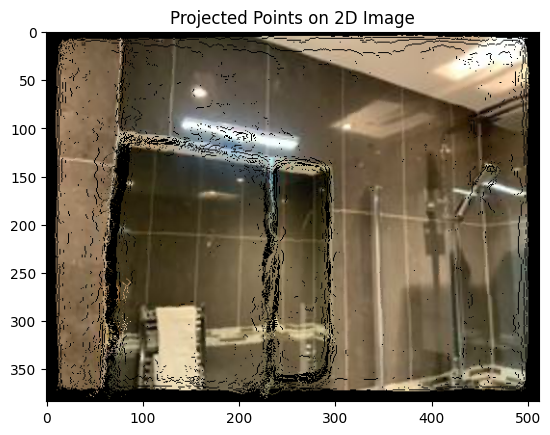

In [9]:
# Display results
print("Projected 2D points (pixels):")
print(pts_2d.shape)

# Simulate an image and plot the projections
image = np.zeros((384,512,3), dtype=np.uint8)

print(image.shape)

# Convert inputs to torch tensors if they aren't already
if not isinstance(pts_2d, torch.Tensor):
    pts_2d = torch.from_numpy(pts_2d)
if not isinstance(target_rgb_image, torch.Tensor):
    target_rgb_image = torch.from_numpy(target_rgb_image)
    
pts_2d_int = pts_2d.round().long()

print(pts_2d_int.shape)

for x in range(pts_2d.shape[0]):    
    for j in range(pts_2d.shape[1]):        
        if(int(pts_2d_int[x, j, 1]) < 384 and int(pts_2d_int[x, j, 0]) < 512):
            pass
            # print(int(pts_2d_int[x, j, 1]), int(pts_2d_int[x, j, 0]))
            image[int(pts_2d_int[x, j, 1]), int(pts_2d_int[x, j, 0])] = upscaled_image[:, x, j]
        else:
            print("Out of bounds")
            print(int(pts_2d_int[x, j, 1]), int(pts_2d_int[x, j, 0]))
        # print(pts_2d[x, j])
   
# Show the image with projections
plt.imshow(image)
plt.title("Projected Points on 2D Image")
plt.show()

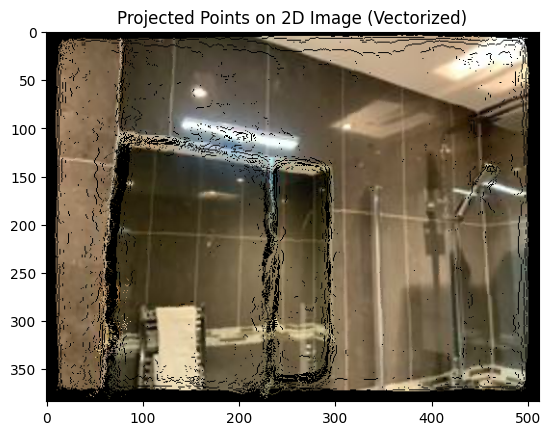

In [10]:
def project_points_torch(pts_2d, rgb_values, image_height=192, image_width=256):
    """
    Vectorized point projection using PyTorch for a single image
    
    Args:
        pts_2d: Tensor of shape (N, 2) containing 2D coordinates
        target_rgb_image: Tensor of shape (N, 3) containing RGB values
        image_height: Height of the output image
        image_width: Width of the output image
    
    Returns:
        Projected image as a tensor
    """
    # Convert inputs to torch tensors if they aren't already
    if not isinstance(pts_2d, torch.Tensor):
        pts_2d = torch.from_numpy(pts_2d)
    if not isinstance(rgb_values, torch.Tensor):
        rgb_values = torch.from_numpy(rgb_values)
    
    # Create empty image tensor
    image = torch.zeros((image_height, image_width, 3), dtype=torch.uint8)
    
    # Round coordinates to integers
    pts_2d_int = pts_2d.round().long()
    
    valid_mask = (pts_2d_int[..., 1] >= 0) & (pts_2d_int[..., 1] < image_height) & \
                (pts_2d_int[..., 0] >= 0) & (pts_2d_int[..., 0] < image_width)
    
    # Get valid coordinates and their corresponding RGB values
    valid_coords = pts_2d_int[valid_mask]
    valid_rgb = rgb_values.permute(1, 2, 0)[valid_mask]  # Reshape RGB values to match coordinates
    
    # Project valid points
    image[valid_coords[:, 1], valid_coords[:, 0]] = valid_rgb
    
    return image  

# Create the projected image
image = project_points_torch(pts_2d, upscaled_image, image_height=H, image_width=W)

# Display the result
plt.imshow(image.numpy())
plt.title("Projected Points on 2D Image (Vectorized)")
plt.show()


In [30]:
x = 50
y = 50
shift = 5

print(pts_2d[x:x+shift, y:y+shift, :])

tensor([[[60.4937, 57.0062],
         [61.3013, 57.0325],
         [62.0776, 57.0951],
         [62.8548, 57.1456],
         [63.7400, 57.2387]],

        [[60.5671, 58.0203],
         [61.4044, 58.0720],
         [62.1992, 58.1313],
         [62.9476, 58.1895],
         [63.8296, 58.2958]],

        [[60.6287, 58.9698],
         [61.4480, 59.0401],
         [62.2005, 59.0969],
         [62.9788, 59.1862],
         [63.8255, 59.2503]],

        [[60.7366, 60.0236],
         [61.5822, 60.0686],
         [62.3235, 60.1083],
         [63.0991, 60.2006],
         [63.8767, 60.2187]],

        [[60.7240, 60.9771],
         [61.5314, 61.0343],
         [62.2099, 61.0192],
         [62.9847, 61.0770],
         [63.7345, 61.0390]]], dtype=torch.float64)


In [31]:
test = pts_2d - gt
print(test[x:x+shift, y:y+shift, :])

tensor([[[ 9.9937,  6.5062],
         [10.8013,  5.5325],
         [11.5776,  4.5951],
         [12.3548,  3.6456],
         [13.2400,  2.7387]],

        [[ 9.0671,  7.5203],
         [ 9.9044,  6.5720],
         [10.6992,  5.6313],
         [11.4476,  4.6895],
         [12.3296,  3.7958]],

        [[ 8.1287,  8.4698],
         [ 8.9480,  7.5401],
         [ 9.7005,  6.5969],
         [10.4788,  5.6862],
         [11.3255,  4.7503]],

        [[ 7.2366,  9.5236],
         [ 8.0822,  8.5686],
         [ 8.8235,  7.6083],
         [ 9.5991,  6.7006],
         [10.3767,  5.7187]],

        [[ 6.2240, 10.4771],
         [ 7.0314,  9.5343],
         [ 7.7099,  8.5192],
         [ 8.4847,  7.5770],
         [ 9.2345,  6.5390]]], dtype=torch.float64)


In [23]:
# Define the ranges for x and y
x = torch.arange(H)
y = torch.arange(W)

# Create a meshgrid of x and y
grid_x, grid_y = torch.meshgrid(x, y, indexing='ij')

# Combine the grid into a single tensor of shape (3, 3, 2)
gt = torch.stack((grid_x, grid_y), dim=-1) + 0.5

print(gt.shape)

torch.Size([384, 512, 2])


In [35]:
mse = torch.sum((gt - pts_2d ** 2), dim=2)
print(mse.shape)
print(mse)


torch.Size([384, 512])
tensor([[-3.9061e+02, -5.6026e+02, -5.1163e+02,  ..., -2.4852e+05,
         -2.4248e+05, -2.3638e+05],
        [-3.9790e+02, -4.6743e+02, -4.6648e+02,  ..., -2.4470e+05,
         -2.4108e+05, -2.4338e+05],
        [-3.7616e+02, -4.5469e+02, -4.5797e+02,  ..., -2.4580e+05,
         -2.4540e+05, -2.4545e+05],
        ...,
        [-1.3368e+05, -1.3636e+05, -1.3391e+05,  ..., -3.7800e+05,
         -3.7806e+05, -3.7889e+05],
        [-1.3798e+05, -1.3718e+05, -1.3672e+05,  ..., -3.7680e+05,
         -3.7561e+05, -3.8025e+05],
        [-1.3418e+05, -1.3476e+05, -1.3483e+05,  ..., -3.8066e+05,
         -3.8332e+05, -3.8182e+05]], dtype=torch.float64)


In [ ]:
def loss(pts_2d, gt):
    # Compute the mean squared error
    mse = torch.mean((gt - pts_2d) ** 2, dim=(-1, -2))
    return mse


In [50]:
X_cam.min(), X_cam.max(), Y_cam.min(), Y_cam.max(), Z_cam.min(), Z_cam.max()

(np.float32(-1.0790021),
 np.float32(0.97335356),
 np.float32(-0.56630796),
 np.float32(1.0952852),
 np.float32(0.7100003),
 np.float32(3.0271518))

In [83]:
X_cam = pts3d_img1[:, :, 0]
Y_cam = pts3d_img1[:, :, 1]
Z_cam = pts3d_img1[:, :, 2]


# here we need to modify for the target image
f_u_target, f_v_target, c_u_target, c_v_target = gt_data['intrinsics'][int(pair[1])][2:]
print(f_u_target, f_v_target, c_u_target, c_v_target)

f_u_target = f_u_target * 4 / W
f_v_target = f_v_target * 4 / H

print(f_u_target, f_v_target, c_u_target, c_v_target)

H, W, _ = pts3d_img1.shape
print(H, W)


# u should be on the x axis
u = (f_u_target * X_cam / Z_cam)
# v should be on the y axis
v = (f_v_target * Y_cam / Z_cam)

print(u.shape)

print(u.min(), u.max(), v.min(), v.max())

# Stack into (N, 2) array
pts_2d_range = np.stack([u, v], axis=-1)
print(pts_2d_range.shape)

print(pts_2d_range.min())
print(pts_2d_range.max())


211.949 211.949 127.933 95.9333
1.6558515625 2.2078020833333336 127.933 95.9333
384 512
(384, 512)
-0.9628362180838087 0.9559586392768872 -0.9772337993075416 1.023463998321399
(384, 512, 2)
-0.9772337993075416
1.023463998321399


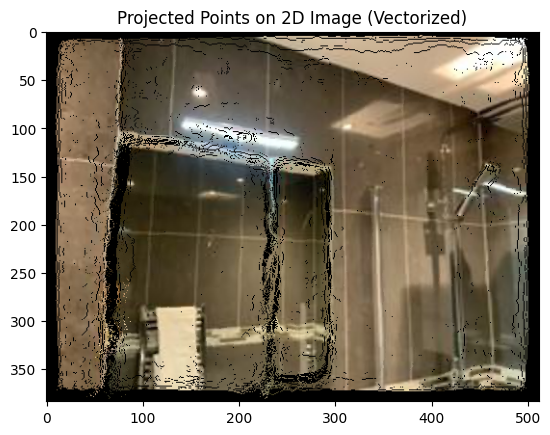

In [84]:
def project_points_torch(pts_2d, rgb_values, image_height=192, image_width=256):
    """
    Vectorized point projection using PyTorch for a single image
    
    Args:
        pts_2d: Tensor of shape (N, 2) containing 2D coordinates
        target_rgb_image: Tensor of shape (N, 3) containing RGB values
        image_height: Height of the output image
        image_width: Width of the output image
    
    Returns:
        Projected image as a tensor
    """
    # Convert inputs to torch tensors if they aren't already
    if not isinstance(pts_2d, torch.Tensor):
        pts_2d = torch.from_numpy(pts_2d)
    if not isinstance(rgb_values, torch.Tensor):
        rgb_values = torch.from_numpy(rgb_values)
    
    # Create empty image tensor
    image = torch.zeros((image_height, image_width, 3), dtype=torch.uint8)
    
    # Round coordinates to integers
    pts_2d_int = pts_2d.round().long()
    
    valid_mask = (pts_2d_int[..., 1] >= 0) & (pts_2d_int[..., 1] < image_height) & \
                (pts_2d_int[..., 0] >= 0) & (pts_2d_int[..., 0] < image_width)
    
    # Get valid coordinates and their corresponding RGB values
    valid_coords = pts_2d_int[valid_mask]
    valid_rgb = rgb_values.permute(1, 2, 0)[valid_mask]  # Reshape RGB values to match coordinates
    
    # Project valid points
    image[valid_coords[:, 1], valid_coords[:, 0]] = valid_rgb
    
    return image  

pts_2d_range_255 = pts_2d_range.copy()
pts_2d_range_255[:,:, 0] = (pts_2d_range_255[:,:, 0] + 1) * W / 2
pts_2d_range_255[:,:, 1] = (pts_2d_range_255[:,:, 1] + 1) * H / 2

# Create the projected image
image = project_points_torch(pts_2d_range_255, upscaled_image, image_height=H, image_width=W)

# Display the result
plt.imshow(image.numpy())
plt.title("Projected Points on 2D Image (Vectorized)")
plt.show()

In [86]:

# Define the ranges for x and y
x = torch.linspace(-1, 1, H)  # Create evenly spaced values from -1 to 1
y = torch.linspace(-1, 1, W)  # Create evenly spaced values from -1 to 1

# Create a meshgrid of x and y
grid_x, grid_y = torch.meshgrid(x, y, indexing='ij')

# Combine the grid into a single tensor of shape (H, W, 2)
gt = torch.stack((grid_x, grid_y), dim=-1)

# print(gt.shape)
# print(gt)

In [87]:
torch_pts_2d_range = torch.tensor(pts_2d_range)
loss_per_pixel = torch.sum(((torch_pts_2d_range - gt)**2), dim=-1)
loss_tot = torch.sum(loss_per_pixel) / (H * W)
print(loss_per_pixel.shape)
print(loss_per_pixel)
print(loss_tot)

torch.Size([384, 512])
tensor([[7.6818e-03, 9.9202e-03, 8.9483e-03,  ..., 7.6144e+00, 7.5570e+00,
         7.3265e+00],
        [6.6356e-03, 8.1460e-03, 7.2324e-03,  ..., 7.5347e+00, 7.5176e+00,
         7.3873e+00],
        [6.1856e-03, 7.1721e-03, 6.7447e-03,  ..., 7.4535e+00, 7.5544e+00,
         7.4887e+00],
        ...,
        [7.3639e+00, 7.4210e+00, 7.3258e+00,  ..., 9.0135e-03, 9.9580e-03,
         1.0056e-02],
        [7.5548e+00, 7.4553e+00, 7.4550e+00,  ..., 1.0465e-02, 1.2383e-02,
         9.8339e-03],
        [7.4407e+00, 7.4553e+00, 7.3459e+00,  ..., 8.2000e-03, 7.9606e-03,
         8.9067e-03]], dtype=torch.float64)
tensor(1.2632, dtype=torch.float64)
